<a href="https://colab.research.google.com/github/niyatiiii28/ES666-CV/blob/main/Copy_of_Assignment2_ES666_Mosaic_of_Whispers_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 📜 Welcome Back, Visioneer
Having successfully passed through **Gate 1: The Chamber of Singular Truths**, you have proven your mastery of decomposition and reconstruction. The Grand Archivist nods approvingly:

"Well done, apprentice. You have learned to see the essential from the chaotic. Now you face Gate 2, where you must combine purification, detection, and recognition to unlock ancient secrets."

But the Archivist's warning echoes still:
"Beware. Those who attempt to pass with borrowed visions or false answers are cursed. Only true effort and understanding unlock the path forward."

## 🌀 Gate 2: Mosaic of Whispers
Theme: Image Denoising, Harris Corner Detection, Feature Matching

In the Gallery of Fragmented Memories, you find a beautiful Byzantine mosaic showing portraits of an ancient philosopher. As you admire it, Professor Dhoom Ketu steps out from the shadows, his wild hair floating and eyes full of mischief.

“Ah! The Mosaic of the Hidden Philosopher!” he says with a grin, handing you the preserved portrait. “This is your reference key.”

Suddenly, the Curse of Temporal Decay strikes—the rest of the mosaic is corrupted with noise and distortions. Professor Ketu sighs, “The curse again! Luckily, I saved the original before it was damaged. Now you can use this for your assignment.”

Run the following code to set things up:



# Assignment setup

In [ ]:
## Importing recipes
%matplotlib inline

import imageio
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
from google.colab import drive
from skimage.color import rgb2gray
# Mounting google drive
drive.mount('/content/drive')


import matplotlib.pyplot as plt

def display_images_in_row(images, labels=None, cmap=None):
    """
    Display multiple images in a single row with labels below them.

    Args:
        images (list): List of images (numpy arrays or tensors convertible to numpy).
        labels (list, optional): List of labels corresponding to each image.
        cmap (str, optional): Colormap for displaying grayscale images.
    """
    num_images = len(images)
    print(f"Displaying {num_images} image{'s' if num_images > 1 else ''}")

    fig, axs = plt.subplots(1, num_images, figsize=(4 * num_images, 4))

    # Ensure axs is iterable
    if num_images == 1:
        axs = [axs]

    for i, (ax, img) in enumerate(zip(axs, images)):
        # Choose colormap
        if cmap is None:
            if img.ndim == 2 or (img.ndim == 3 and img.shape[2] == 1):
                ax.imshow(img.squeeze(), cmap="gray")
            else:
                ax.imshow(img)
        else:
            ax.imshow(img, cmap=cmap)

        ax.axis("off")

        # Add label below image if available
        if labels is not None and i < len(labels):
            ax.set_title(labels[i], fontsize=12, fontweight="bold", pad=10)

    plt.tight_layout()
    plt.show()


# Resize the original image to a smaller size
def resize_image(img, max_size=200):
    """Resize image while maintaining aspect ratio"""
    h, w = img.shape[:2]
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        new_h, new_w = int(h * scale), int(w * scale)
        resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
        return resized
    return img


## Making recipes
base_path = "/content/drive/My Drive/ES666CV/B/"
mosaic_path = os.path.join(base_path, "mosaic.jpg")
key_path = os.path.join(base_path, "key.jpg")

# Load images
mosaic = cv2.imread(mosaic_path)        # BGR format
key = cv2.imread(key_path)

# Convert to RGB for matplotlib display
mosaic_rgb = cv2.cvtColor(mosaic, cv2.COLOR_BGR2RGB)
key_rgb = cv2.cvtColor(key, cv2.COLOR_BGR2RGB)

# Also convert to grayscale (float [0,1]) if needed for processing
mosaic_gray = rgb2gray(mosaic_rgb)
key_gray = rgb2gray(key_rgb)
mosaic_rgb_rs = resize_image(mosaic_rgb, max_size=500)
mosaic_rgb_rs = mosaic_rgb_rs.astype(np.float32) / 255.0

Mounted at /content/drive


# Mosaic and Key

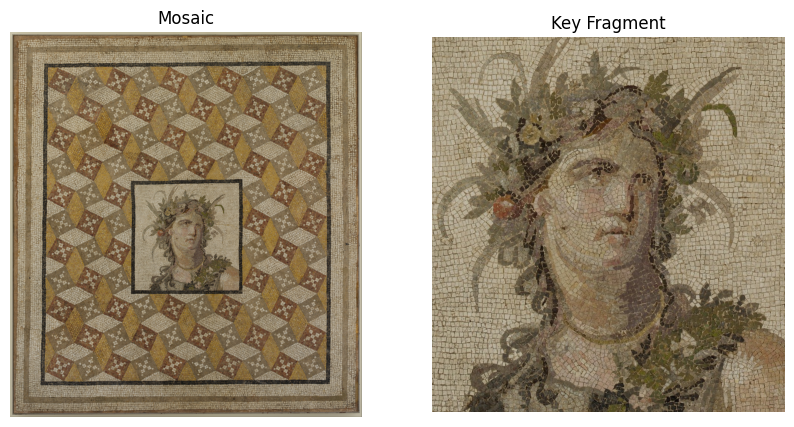

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(mosaic_rgb)
axs[0].set_title("Mosaic")
axs[0].axis("off")
axs[1].imshow(key_rgb)
axs[1].set_title("Key Fragment")
axs[1].axis("off")
plt.show()

### Task 1: Master the Arts of Purification (4 Marks)
Professor Ketu: "First, we must counteract the curse using the four sacred filtering techniques."

Implement the four denoising methods (mean, median, bilateral and gaussian) and compare their effectiveness:

In [ ]:
# run this cell as it is

def add_gaussian_noise(img, mean=0, var=0.01):
    if img.dtype != np.float32:
        img = img.astype(np.float32) / 255.0

    sigma = var**0.5
    noise = np.random.normal(mean, sigma, img.shape).astype(np.float32)
    noisy_img = np.clip(img + noise, 0.0, 1.0)

    return noisy_img


def add_salt_pepper_noise(img, amount=0.05):

    noisy_img = img.copy()
    H, W, _ = noisy_img.shape

    num_noisy_pixels = int(amount * H * W)

    row_coords = np.random.randint(0, H, num_noisy_pixels)
    col_coords = np.random.randint(0, W, num_noisy_pixels)

    num_salt = num_noisy_pixels // 2

    noisy_img[row_coords[:num_salt], col_coords[:num_salt], :] = 1.0

    noisy_img[row_coords[num_salt:], col_coords[num_salt:], :] = 0.0

    return noisy_img

def generate_noisy_versions_rgb(img, gaussian_vars, sp_amounts):

    noisy_versions = {
        "gaussian": np.array([add_gaussian_noise(img, var=v) for v in gaussian_vars]),
        "salt_pepper": np.array([add_salt_pepper_noise(img, amount=a) for a in sp_amounts])
    }
    return noisy_versions

gaussian_vars = [0.001, 0.01, 0.05]       # variance levels
sp_amounts = [0.01, 0.05, 0.1]           # salt & pepper intensity

noisy_mosaic = generate_noisy_versions_rgb(mosaic_rgb_rs, gaussian_vars, sp_amounts)



Gaussian Noise with different variance
Displaying 3 images


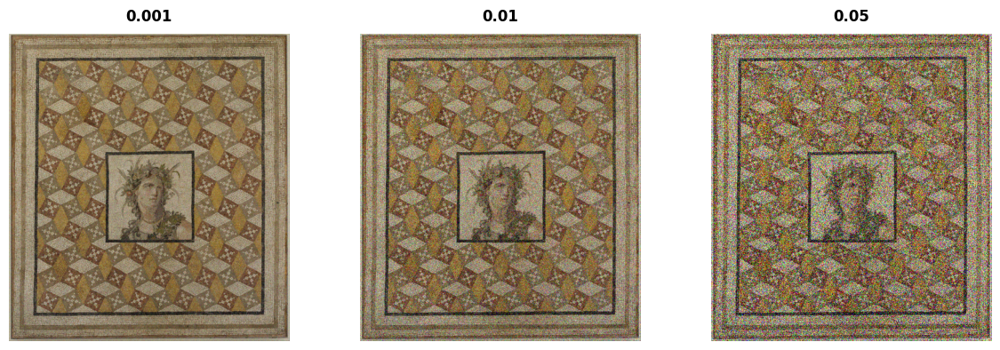

Salt and pepper Noise with different intensities
Displaying 3 images


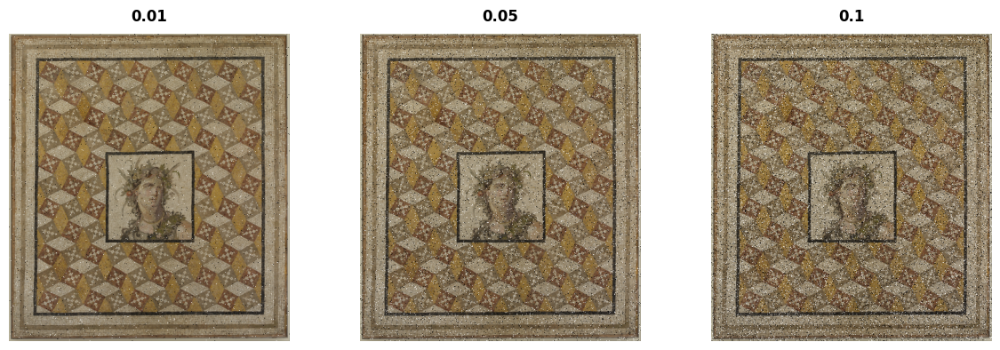

In [ ]:
print("Gaussian Noise with different variance")
display_images_in_row(noisy_mosaic["gaussian"],labels=["0.001","0.01","0.05"])
print("Salt and pepper Noise with different intensities")
display_images_in_row(noisy_mosaic["salt_pepper"], labels=["0.01","0.05","0.1"])



### Implement filters here for all the noise levels

In [ ]:
import numpy as np

def mean_filter(img, kernel_size=3):
    # Write your code here
    #pad the image to not loose the edge values
    pad=kernel_size//2
    pad_channel=((pad,pad),(pad,pad),(0,0))

    img_pad=np.pad(img, pad_channel, mode='constant')

    #to store the filtered image
    filtered = np.zeros(img.shape, dtype=np.float32)

    #loop across the rows and columns
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            region=img_pad[i: i+kernel_size , j: j+kernel_size]
            filtered[i,j]=np.mean(region, axis=(0, 1))

    return filtered

def median_filter(img, kernel_size=3):
    # Write your code here
    #pad the image to not loose the edge values
    pad=kernel_size//2
    pad_channel=((pad,pad),(pad,pad),(0,0))
    img_pad=np.pad(img, pad_channel, mode='constant')

    #to store the filtered image
    filtered = np.zeros(img.shape, dtype=np.float32)

    #loop across the rows and columns
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            region=img_pad[i: i+kernel_size , j: j+kernel_size]
            filtered[i,j]=np.median(region, axis=(0, 1))

    return filtered

def gaussian_filter(img, kernel_size=5, sigma=1.0):
    # Write your code here
    #create the gaussian function
    center=kernel_size//2
    a=np.arange(-center  , center + 1)
    x,y= np.meshgrid(a,a)

    kernel=np.exp(-(x**2 + y**2) / (2* sigma**2))
    kernel= kernel / np.sum(kernel)

    #padding
    pad=kernel_size//2
    pad_channel=((pad,pad),(pad,pad),(0,0))
    img_pad=np.pad(img, pad_channel, mode='constant')
    filtered=np.zeros(img.shape , dtype=np.float32)

    #filtering
    for i in range(img.shape[0]):
      for j in range(img.shape[1]):
        region=img_pad[i: i+kernel_size , j: j+kernel_size]
        filtered[i,j]=np.sum(region * kernel[:, : , np.newaxis], axis=(0,1))

    return filtered

def bilateral_filter(img, diameter=5, sigma_color=0.2, sigma_space=2.0):
    # Write your code here
    #padding
    pad=diameter//2
    pad_channel=((pad,pad),(pad,pad),(0,0))

    img_pad=np.pad(img, pad_channel, mode='constant')
    filtered=np.zeros(img.shape, dtype=np.float32)

    a=np.arange(-pad , pad+1)
    x,y= np.meshgrid(a,a)
    kernel_space=np.exp(-(x**2 + y**2) / (2* sigma_space**2))

    #filtering
    for i in range(img.shape[0]):
      for j in range(img.shape[1]):
        #extract the neighborhood region
        region=img_pad[i: i+diameter , j: j+diameter]

        #get the center pixel
        center=img_pad[i+pad , j+pad]

        #calculate the difference
        color_diff= np.sum((region - center)**2, axis=2)
        kernel_color=np.exp(-color_diff / (2* sigma_color**2))

        total_kernel=kernel_space * kernel_color
        norm_kernel=total_kernel / np.sum(total_kernel)

        filtered[i,j]=np.sum(region* norm_kernel[:,:, np.newaxis], axis=(0,1))

    return filtered



Testing on gaussian Noise
Noise level 0.001
Displaying 5 images


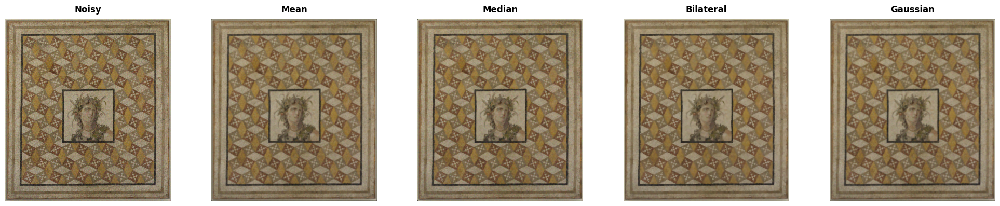

metric Scores: 
Mean PSNR: 25.59 SSIM: 0.70
Median PSNR: 26.53 SSIM: 0.71
Bilateral PSNR: 29.25 SSIM: 0.82
Gaussian PSNR: 26.12 SSIM: 0.74
Noise level 0.01
Displaying 5 images


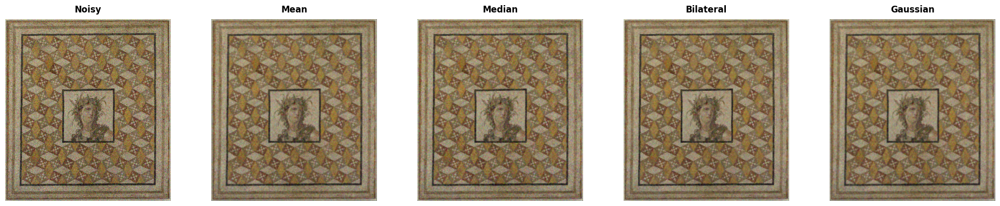

metric Scores: 
Mean PSNR: 24.25 SSIM: 0.62
Median PSNR: 23.97 SSIM: 0.59
Bilateral PSNR: 26.04 SSIM: 0.74
Gaussian PSNR: 24.96 SSIM: 0.67
Noise level 0.05
Displaying 5 images


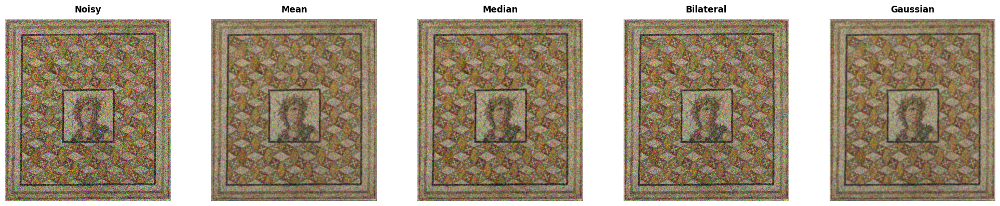

metric Scores: 
Mean PSNR: 21.09 SSIM: 0.45
Median PSNR: 19.62 SSIM: 0.38
Bilateral PSNR: 15.70 SSIM: 0.29
Gaussian PSNR: 22.03 SSIM: 0.51
Testing on salt_pepper Noise
Noise level 0.01
Displaying 5 images


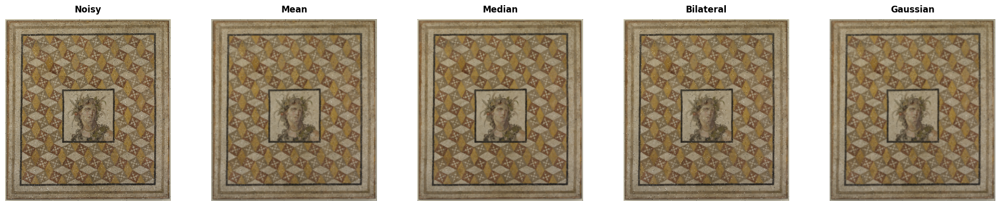

metric Scores: 
Mean PSNR: 25.27 SSIM: 0.68
Median PSNR: 26.99 SSIM: 0.73
Bilateral PSNR: 24.28 SSIM: 0.69
Gaussian PSNR: 25.82 SSIM: 0.72
Noise level 0.05
Displaying 5 images


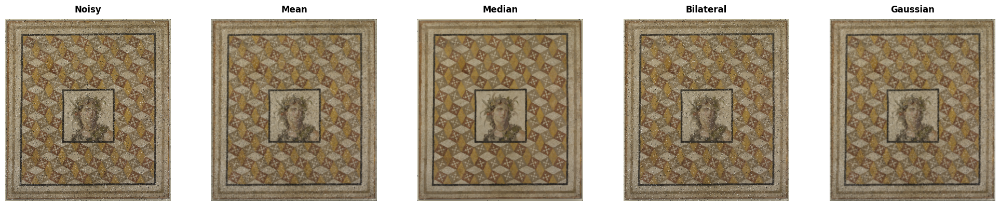

metric Scores: 
Mean PSNR: 23.71 SSIM: 0.59
Median PSNR: 26.69 SSIM: 0.73
Bilateral PSNR: 18.55 SSIM: 0.41
Gaussian PSNR: 24.40 SSIM: 0.64
Noise level 0.1
Displaying 5 images


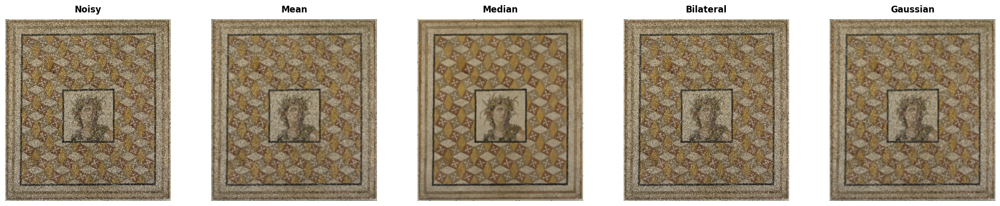

metric Scores: 
Mean PSNR: 22.34 SSIM: 0.52
Median PSNR: 26.18 SSIM: 0.72
Bilateral PSNR: 15.80 SSIM: 0.26
Gaussian PSNR: 23.09 SSIM: 0.57


In [ ]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def test_filters_for_metrics(original_img, noisy_versions, filter_functions, filter_names):

      noise_params = [
          ('gaussian', [0.001, 0.01, 0.05]),
          ('salt_pepper', [0.01, 0.05, 0.1])
      ]

      for noise_type, params in noise_params:
          print(f"Testing on {noise_type} Noise")
          for i, param in enumerate(params):
              print(f"Noise level {param}")
              noisy = noisy_versions[noise_type][i]
              denoised_imgs = [f(noisy) for f in filter_functions]

              #display the results
              display_images_in_row([noisy]+ denoised_imgs, ["Noisy"] + filter_names)

              print('metric Scores: ')
              for j, function_name in enumerate(filter_names):
                denoised=denoised_imgs[j]

                ori_clean=np.clip(original_img, 0.0, 1.0)
                denoised_clean=np.clip(denoised, 0.0, 1.0)

                #calculate psnr and ssim values
                p=psnr(ori_clean, denoised_clean, data_range=1.0)
                s=ssim(ori_clean, denoised_clean, data_range=1.0 , channel_axis=-1)
                print(f"{function_name} PSNR: {p:.2f} SSIM: {s:.2f}")

filter_functions = [mean_filter, median_filter, bilateral_filter, gaussian_filter]
filter_names = ['Mean', 'Median', 'Bilateral', 'Gaussian']

test_filters_for_metrics(mosaic_rgb_rs,noisy_mosaic, filter_functions, filter_names)

📖 Theory Q: Question: Which filtering method works best for gaussian noise and which works for salt and pepper noise? Why?   
Ans: A Gaussian filter works most effectivily for Gaussian noise, because it uses weighted averaging to smooth out the fine, random variations. On the other hand, for salt and pepper noise, the Median filter is works the best. This is because salt and pepper noise consists of extreme, sparse outlier pixels like pure black and white pixels. A median filter is a non-linear sorting filter. It selects the middle pixel value in a given neighborhood, which allows it to completely ignore and eliminate these outliers. While an averaging filter would simply blur them into smudges.

### Task 2: Detect the Points of Truth (3 Marks)
Professor Ketu: "Seek geometric truth in the original, not the corrupted version! The curse creates false corners."

Implement Harris Corner Detection on the pristine original image:

found 3533 corners in key
Displaying 2 images


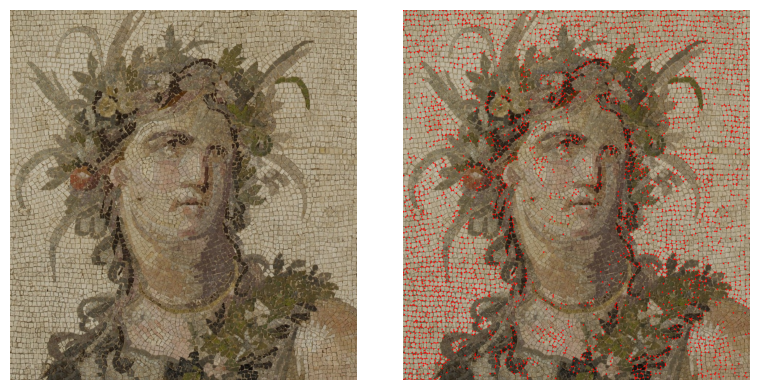

found 12779 corners in mosaic
Displaying 2 images


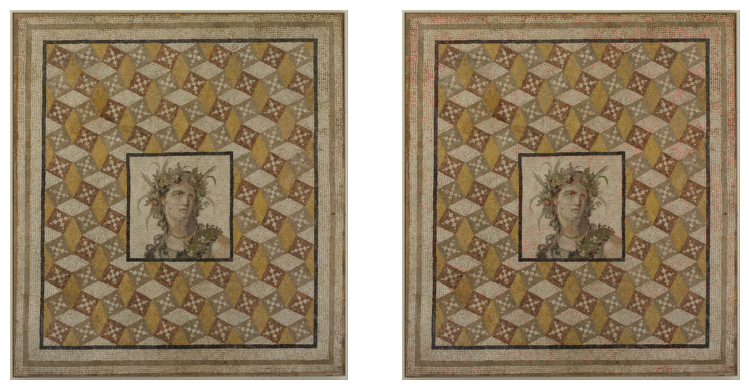

In [ ]:
def detect_harris_corner(image,  k=0.04, threshold=0.04):
  # Write your code here
  #create a copy of the image
  corner_image = np.copy(image)

  #convert the image into gray scale because harris corner detection only works for single channel images
  gray_image=rgb2gray(image)
  gray_image=gray_image.astype(np.float32)

  #Use sobel operator to calculate the gradients in x and y directions
  sobel_x=np.array([[-1,0,1],
                    [-2,0,2],
                     [-1,0,1]], dtype=np.float32)

  sobel_y=np.array([[-1,-2,-1],
                    [0,0,0],
                     [1,2,1]], dtype=np.float32)

  Ix=np.zeros(gray_image.shape, dtype=np.float32)
  Iy=np.zeros(gray_image.shape, dtype=np.float32)

  pad=1
  img_pad = np.pad(gray_image, pad, mode='symmetric')

  for i in range(gray_image.shape[0]):
      for j in range(gray_image.shape[1]):
            region = img_pad[i : i + 3 , j : j + 3]
            Ix[i,j] = np.sum(region * sobel_x)
            Iy[i,j] = np.sum(region * sobel_y)

  #Calculate the entries of M
  Ixx=Ix**2
  Iyy=Iy**2
  Ixy=Ix*Iy

  #Apply gaussian filter
  Ixx=gaussian_filter(Ixx,sigma=1)
  Iyy=gaussian_filter(Iyy,sigma=1)
  Ixy=gaussian_filter(Ixy,sigma=1)

  #calculating R(harris response)
  detM= Ixx * Iyy - Ixy**2
  traceM= Ixx + Iyy
  R= detM - k * (traceM ** 2)

  #Thresholding
  threshold = threshold * R.max()
  candidate_corners=np.argwhere(R > threshold)

  #non-maximum suppression
  #store all the corners in the list
  final_corners=[]

  #Size of area to look around
  radius=3

  for y,x in candidate_corners:
        #define the top left and bottom right corner so we dont go outside the image
        y_min= max(0, y-radius)
        y_max= min(R.shape[0], y+radius+1)
        x_min= max(0, x-radius)
        x_max= min(R.shape[1], x+radius+1)

        #if the corner's score is highest in its entire neighborhood then we will select that corner
        if R[y,x]==R[y_min:y_max, x_min:x_max].max():
          final_corners.append((y,x))

  #draw the final corners as red
  for y, x in final_corners:
        cv2.circle(corner_image, (x, y), 2, (255, 0, 0), -1)

  return corner_image ,final_corners

key_harris , key_corners = detect_harris_corner(key_rgb)
mosaic_harris , mosaic_corners = detect_harris_corner(mosaic_rgb)

print(f"found {len(key_corners)} corners in key")
display_images_in_row([key_rgb,key_harris])

print(f"found {len(mosaic_corners)} corners in mosaic")
display_images_in_row([mosaic_rgb,mosaic_harris])

📖 Theory Q: What mathematical property of the Harris matrix allows it to distinguish between edges and corners?  
Ans. The Harris matrix uses image gradients to record the intensity change  in different directions. It uses eigenvalues which is the most important part. eigenvalues indicate how much the image intensity changes along two orthogonal directions. When one eigenvalue is large and the other is small, the point lies on an edge, as the intensity varies strongly in only one direction. When both eigenvalues are large, the point is a corner, since the intensity changes significantly in two directions. This eigenvalue behavior allows the Harris detector to distinguish between flat regions, edges, and corners effectively.

### Task 3: Find the Hidden Philosopher (3 Marks)
Professor Ketu: "Combine my teachings! Let the original guide your search, let clarity reveal the details."

Implement feature matching to find the philoshopher in the mosaic, you can use SSD (Sum of squared differences):

Hint:How can you describe small patches around keypoints in both images?  
 How do you measure similarity between descriptors?

In [ ]:
def extract_descriptors(img, corners, patch_size=15):
    # Write your code here
    descriptors, valid_points = [], []
    center=patch_size//2

    for y,x in corners:
      y,x = int(y) , int(x)

      #check if the selected patch is valid(inside the image only)
      if y-center >=0 and y+center < img.shape[0] and x-center>=0 and x+center< img.shape[1]:
        region=img[y-center : y+center+1 , x-center: x+center+1]
        descriptors.append(region.flatten())
        valid_points.append([y,x])

    return np.array(valid_points), np.array(descriptors)

def match_features(desc1, desc2, pts1, pts2, ratio=0.7):
    # Write your code here
    matches = []

    #iterate through all the descriptors one by one
    for i, d1 in enumerate(desc1):

          #calculate the sum of squared differences(SSD) between d1 and all descriptors
          dis=np.sum((d1-desc2)**2, axis=1)

          #sort them by distance and find the best 2 matches
          sorted_idx=np.argsort(dis)

          best_match_idx=sorted_idx[0]
          second_best_match_idx=sorted_idx[1]

          #Ration test to make decision for ambiguous matches
          if dis[best_match_idx]< ratio * dis[second_best_match_idx]:

            #then we will keep these indices
            matches.append( (pts1[i], pts2[best_match_idx]) )

    return matches

pts_mosaic, desc_mosaic = extract_descriptors(mosaic_rgb, mosaic_corners)
pts_key, desc_key = extract_descriptors(key_rgb, key_corners)

[(array([  7, 231]), array([1528, 1519])), (array([  7, 578]), array([1528, 1866])), (array([  8, 185]), array([1529, 1473])), (array([  8, 209]), array([1529, 1497])), (array([  8, 218]), array([1529, 1506])), (array([  8, 708]), array([1529, 1996])), (array([  9, 260]), array([1530, 1548])), (array([  9, 383]), array([1530, 1671])), (array([  9, 603]), array([1530, 1891])), (array([  9, 647]), array([1530, 1935])), (array([ 10, 145]), array([1531, 1433])), (array([ 10, 156]), array([1531, 1444])), (array([ 10, 174]), array([1531, 1462])), (array([11,  9]), array([1532, 1297])), (array([ 11, 130]), array([1532, 1418])), (array([ 11, 754]), array([1532, 2042])), (array([12, 28]), array([1533, 1316])), (array([12, 80]), array([1533, 1368])), (array([ 12, 744]), array([1533, 2032])), (array([13, 20]), array([1534, 1308])), (array([13, 67]), array([1534, 1355])), (array([ 13, 115]), array([1534, 1403])), (array([ 13, 163]), array([1534, 1451])), (array([ 13, 190]), array([1534, 1478])), (

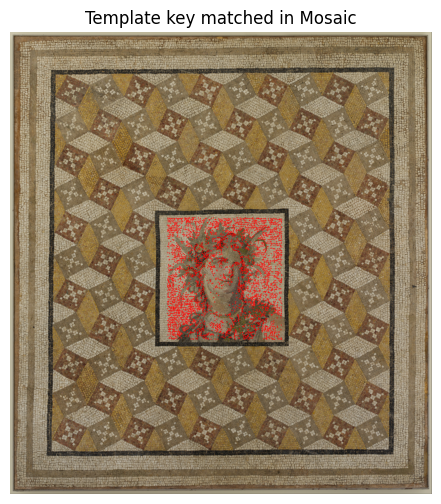

In [ ]:
matches = match_features(desc_key, desc_mosaic, pts_key, pts_mosaic)

print(matches)
mosaic_vis = mosaic_rgb.copy()
for (y1, x1), (y2, x2) in matches:
    cv2.circle(mosaic_vis, (x2, y2), 3, (255, 0, 0), 2)

plt.figure(figsize=(10, 6))
plt.imshow(mosaic_vis)
plt.title("Template key matched in Mosaic")
plt.axis("off")
plt.show()

📖 Theory Q: What are potential weaknesses of SSD-based matching compared to modern descriptors like SIFT/ORB?  
Ans. SSD based matching compares raw pixel intensity values directly, that is why it is extremely sensetive to variations in scale and rotation. Any geometric or lighting transformation can drastically alter the content of the patch, which causes a high difference score and it might give a poor match.  On the other hand, modern descriptors like SIFT/ORB are made to be invariant to these changes. They achieve this by normalizing the patch's scale and orientation and using representations like gradients in SIFT or binary patterns in ORB that are inherently more robust to brightness variations.